<a href="https://colab.research.google.com/github/Antik0829/Lab-Task-3/blob/main/AI_ML_Lab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [201]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [202]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from pandas.core.common import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)
from sklearn.model_selection import train_test_split,cross_val_predict
from sklearn.model_selection import cross_val_predict
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import confusion_matrix, classification_report,plot_roc_curve,plot_precision_recall_curve

%matplotlib inline

In [203]:
# models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics

In [204]:
df = pd.read_csv('/content/gdrive/MyDrive/AI/cardio_train.csv',sep=';')

In [205]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Created wheel for pandas-profiling: filename=pandas_profiling-2.12.0-py2.py3-none-any.whl size=243829 sha256=777c2eb562f191ce7351be7d6c89fc100f71558846033e510b31111c6fea7f75
  Stored in directory: /tmp/pip-ephem-wheel-cache-klgc0e2j/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
Successfully built pandas-profiling


In [206]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [207]:
df.dtypes

id               int64
age              int64
gender           int64
height           int64
weight         float64
ap_hi            int64
ap_lo            int64
cholesterol      int64
gluc             int64
smoke            int64
alco             int64
active           int64
cardio           int64
dtype: object

In [208]:
df.shape

(70000, 13)

In [209]:
df.isnull().values.any()  # cheack missing value

False

In [210]:
df.isna().sum()   # check null values

id             0
age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64

In [211]:
df.keys()   # check keys

Index(['id', 'age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo',
       'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='object')

In [212]:
df.info()   ##get information about the data features, the amount of instances and the amount of Nan values.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


In [213]:
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


As you can see there are no null values in the data frame. 

Delete the 'id' feature that does not provide important information. 

In [214]:
df.drop("id",axis=1,inplace=True)

In [215]:
df.shape

(70000, 12)

In [216]:
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [217]:
df['cardio'].value_counts()  

0    35021
1    34979
Name: cardio, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


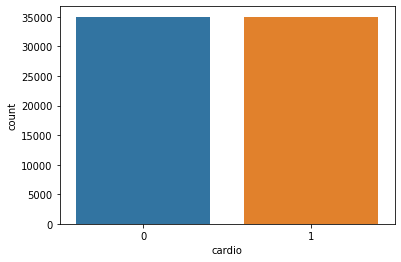

In [218]:
sns.countplot(df['cardio'])

In [219]:
females_without_cardiovascular=np.logical_and(df['gender']==1,df['cardio']==0).sum()
print("females not having cardiovascular disease = ",females_without_cardiovascular)
females_with_cardiovascular=np.logical_and(df['gender']==1,df['cardio']==1).sum()
print("females having cardiovascular disease = ",females_with_cardiovascular)
males_without_cardiovascular=np.logical_and(df['gender']==2,df['cardio']==0).sum()
print("Males not having cardiovascular disease = ",males_without_cardiovascular)
males_with_cardiovascular=np.logical_and(df['gender']==2,df['cardio']==1).sum()
print("Males having cardiovascular disease = ",males_with_cardiovascular)

females not having cardiovascular disease =  22914
females having cardiovascular disease =  22616
Males not having cardiovascular disease =  12107
Males having cardiovascular disease =  12363


In [220]:
#distribution based on Gender
print("Total females = ",df[df['gender']==1].shape[0])
print("Total males = ",df[df['gender']==2].shape[0])

Total females =  45530
Total males =  24470


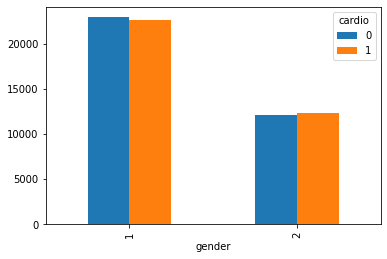

In [221]:
df.pivot_table(index='gender', columns='cardio',values='weight' , aggfunc='count').plot(kind='bar')

In [222]:
Smokers_without_cardiovascular=np.logical_and(df['smoke']==1,df['cardio']==0).sum()
print("Smokers not having cardiovascular disease = ",Smokers_without_cardiovascular)
Smokers_with_cardiovascular=np.logical_and(df['smoke']==1,df['cardio']==1).sum()
print("Smokers having cardiovascular disease = ",Smokers_with_cardiovascular)
Non_Smokers_without_cardiovascular=np.logical_and(df['smoke']==0,df['cardio']==0).sum()
print("Non Smokers not having cardiovascular disease = ",Non_Smokers_without_cardiovascular)
Non_Smokers_with_cardiovascular=np.logical_and(df['smoke']==0,df['cardio']==1).sum()
print("Non Smokers having cardiovascular disease = ",Non_Smokers_with_cardiovascular)

Smokers not having cardiovascular disease =  3240
Smokers having cardiovascular disease =  2929
Non Smokers not having cardiovascular disease =  31781
Non Smokers having cardiovascular disease =  32050


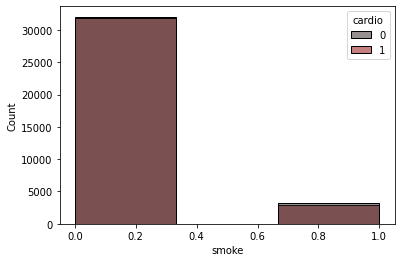

In [223]:
sns.histplot(data=df,x='smoke',bins=3,hue='cardio',palette="dark:darkred", alpha=0.5)

In [224]:
#Distribution based on if person consumes alcohol or not
print("Number of people who consume alcohol = ",df[df['alco']==1].shape[0])
print("Number of people who don't consume alcohol = ",df[df['alco']==0].shape[0])

Number of people who consume alcohol =  3764
Number of people who don't consume alcohol =  66236


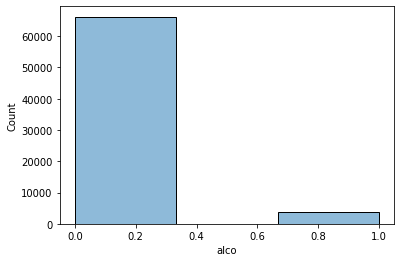

In [225]:
sns.histplot(data=df,x='alco',bins=3,palette="dark:darkred", alpha=0.5)

In [226]:
ac_without_cardiovascular=np.logical_and(df['alco']==1,df['cardio']==0).sum()
print("Alcohol consumer not having cardiovascular disease = ",ac_without_cardiovascular)
ac_with_cardiovascular=np.logical_and(df['alco']==1,df['cardio']==1).sum()
print("Alcohol consumer having cardiovascular disease = ",ac_with_cardiovascular)
nac_without_cardiovascular=np.logical_and(df['alco']==0,df['cardio']==0).sum()
print("Non alcohol consumer not having cardiovascular disease = ",nac_without_cardiovascular)
nac_with_cardiovascular=np.logical_and(df['alco']==0,df['cardio']==1).sum()
print("Non alcohol consumer having cardiovascular disease = ",nac_with_cardiovascular)

Alcohol consumer not having cardiovascular disease =  1941
Alcohol consumer having cardiovascular disease =  1823
Non alcohol consumer not having cardiovascular disease =  33080
Non alcohol consumer having cardiovascular disease =  33156


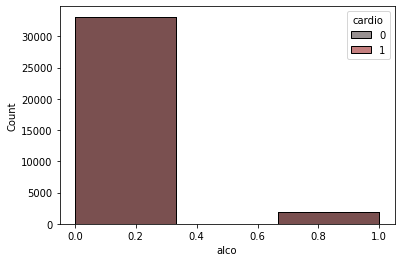

In [227]:
sns.histplot(data=df,x='alco',bins=3,hue='cardio',palette="dark:darkred", alpha=0.5)

**The 'Age' feature counts age by days. Convert it to age by years.**

In [228]:
print("Number of negative values of age  = ",df[df['age']<0].shape[0])

Number of negative values of age  =  0


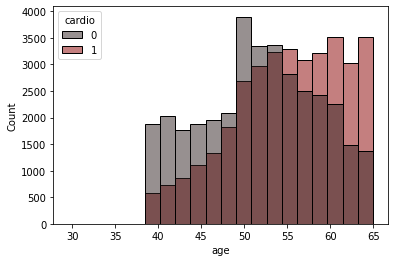

In [229]:
df['age']=df['age']/365

sns.histplot(data=df,x='age',bins=20,hue='cardio',palette="dark:darkred", alpha=0.5)

Over all Data compare 

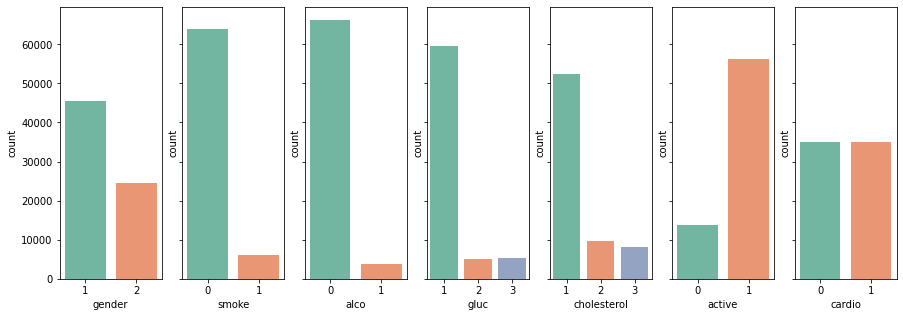

In [230]:
f, axes = plt.subplots(1, 7, figsize=(15, 5), sharex=False,sharey=True)
sns.countplot(x='gender',data=df,ax=axes[0],palette="Set2")
sns.countplot(x='smoke',data=df,ax=axes[1],palette="Set2")
sns.countplot(x='alco',data=df,ax=axes[2],palette="Set2")
sns.countplot(x='gluc',data=df,ax=axes[3],palette="Set2")
sns.countplot(x='cholesterol',data=df,ax=axes[4],palette="Set2")
sns.countplot(x='active',data=df,ax=axes[5],palette="Set2")
sns.countplot(x='cardio',data=df,ax=axes[6],palette="Set2")


In [231]:
df.describe()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,53.339358,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700
std,6.759594,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003
min,29.583562,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,48.394521,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,53.980822,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,58.430137,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,64.967123,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [232]:
print("There is {} duplicated values".format(df.duplicated().sum()))

There is 24 duplicated values


In [233]:
duplicated = df[df.duplicated(keep=False)]
duplicated = duplicated.sort_values(by=['age', "gender", "height"], ascending= False) 
# I sorted the values to see duplication clearly

duplicated.head(2) # Show us just 1 duplication of 24

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
2677,60.484932,1,175,69.0,120,80,1,1,0,0,1,1
45748,60.484932,1,175,69.0,120,80,1,1,0,0,1,1


In [234]:
df.duplicated().sum()

24

In [235]:
df.drop_duplicates(inplace=True) #delete duplicates values.

In [236]:
print("There is {} duplicated values".format(df.duplicated().sum()))
print("There is {} missing values ".format(df.isnull().sum().sum()))

There is 0 duplicated values
There is 0 missing values 


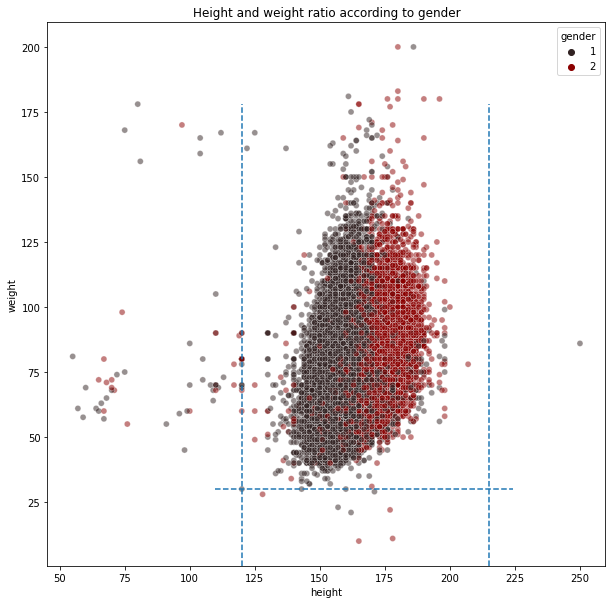

In [237]:
#plot relation height-weight by gender
f, ax = plt.subplots(figsize = (10,10))
sns.scatterplot(data=df, x="height", y="weight",hue='gender',palette="dark:darkred", alpha=0.5)
ax.axvline(120, ls='--',ymax=0.85)
ax.axvline(215, ls='--',ymax=0.85)
ax.axhline(30, ls='--',xmin=0.3,xmax=0.835)
plt.title("Height and weight ratio according to gender")
plt.show()

**Delete unreasonable height and weight data.**

In [238]:
df=df.query('height >= 120 & height <=215 & weight >= 30')

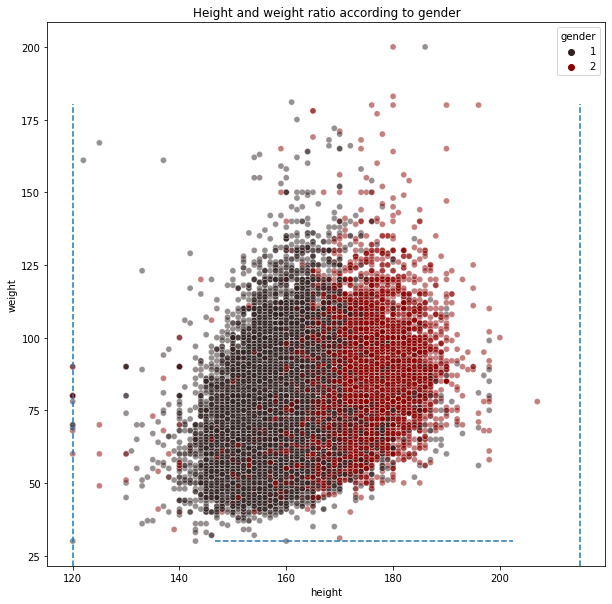

In [239]:
#plot relation height-weight by gender
f, ax = plt.subplots(figsize = (10,10))
sns.scatterplot(data=df, x="height", y="weight",hue='gender',palette="dark:darkred", alpha=0.5)
ax.axvline(120, ls='--',ymax=0.85)
ax.axvline(215, ls='--',ymax=0.85)
ax.axhline(30, ls='--',xmin=0.3,xmax=0.835)
plt.title("Height and weight ratio according to gender")
plt.show()

In [240]:
df.corr()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
age,1.000000,-0.022683,-0.086019,0.054171,0.020767,0.017656,0.154546,0.098777,-0.047628,-0.029688,-0.009976,0.238187
gender,-0.022683,1.000000,0.517307,0.156240,0.005980,0.015154,-0.035887,-0.020532,0.338176,0.170966,0.005884,0.008134
height,-0.086019,0.517307,1.000000,0.306074,0.005272,0.005690,-0.054443,-0.021119,0.194615,0.097348,-0.007475,-0.012154
weight,0.054171,0.156240,0.306074,1.000000,0.030641,0.044131,0.141875,0.106935,0.067544,0.067209,-0.016889,0.182027
ap_hi,0.020767,0.005980,0.005272,0.030641,1.000000,0.016053,0.023728,0.011812,-0.000946,0.001385,-0.000043,0.054459
ap_lo,0.017656,0.015154,0.005690,0.044131,0.016053,1.000000,0.023921,0.010674,0.005194,0.010604,0.004750,0.065661
cholesterol,0.154546,-0.035887,-0.054443,0.141875,0.023728,0.023921,1.000000,0.451615,0.010395,0.035812,0.009919,0.221100
gluc,0.098777,-0.020532,-0.021119,0.106935,0.011812,0.010674,0.451615,1.000000,-0.004769,0.011245,-0.006801,0.089301
smoke,-0.047628,0.338176,0.194615,0.067544,-0.000946,0.005194,0.010395,-0.004769,1.000000,0.339961,0.025786,-0.015597
alco,-0.029688,0.170966,0.097348,0.067209,0.001385,0.010604,0.035812,0.011245,0.339961,1.000000,0.025427,-0.007181


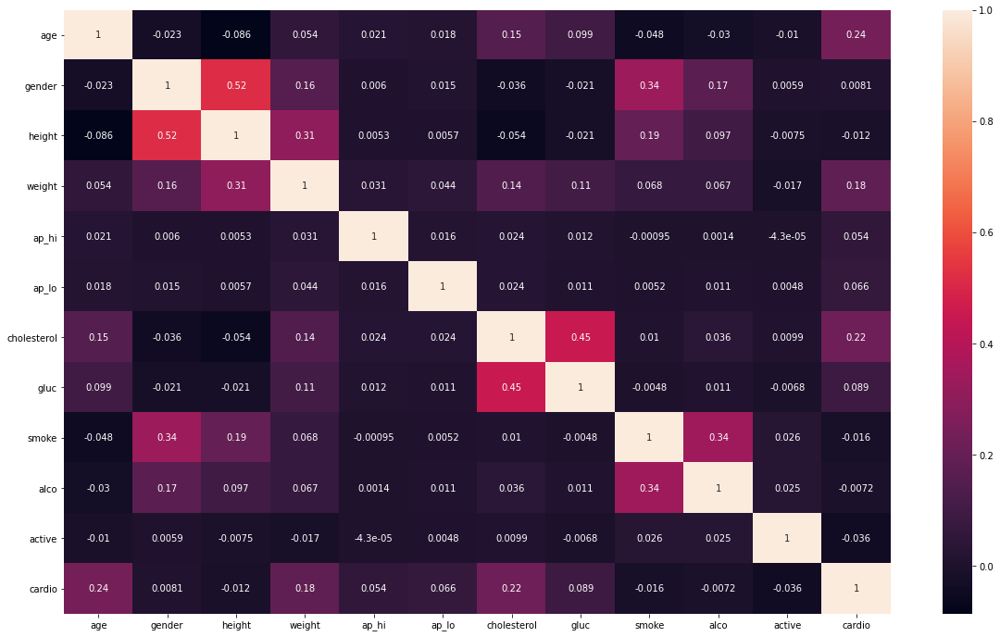

In [241]:
plt.figure(figsize=(20, 12))          # see the relation between all attributes
sns.heatmap(df.corr(), annot=True)

-------**************----------

Height and weight seems uncorrelated with the cardio feature but Body Mass Index could be helpful to train our model.

**We will add to the data feature 'bmi' according to the following formula:**

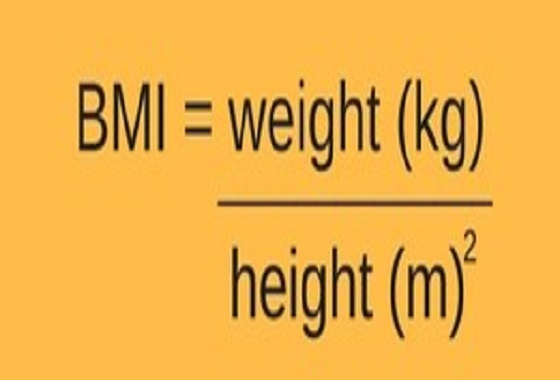

**This feature represents the 'height' ,'weight' features and can therefore be deleted.**

In [242]:
def bmi_calc(w, h):
    return w/(h**2)

In [243]:
df["bmi"] = df["weight"]/ (df["height"]/100)**2

In [244]:
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
0,50.391781,2,168,62.0,110,80,1,1,0,0,1,0,21.967120
1,55.419178,1,156,85.0,140,90,3,1,0,0,1,1,34.927679
2,51.663014,1,165,64.0,130,70,3,1,0,0,0,1,23.507805
3,48.282192,2,169,82.0,150,100,1,1,0,0,1,1,28.710479
4,47.873973,1,156,56.0,100,60,1,1,0,0,0,0,23.011177


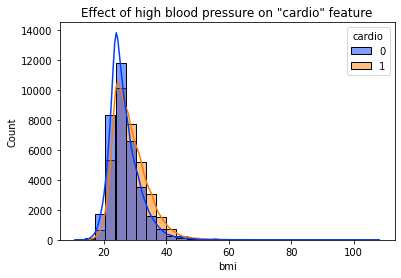

In [245]:
sns.histplot(data=df,x='bmi',hue='cardio',kde=True,bins=30,palette='bright')
plt.title('Effect of high blood pressure on "cardio" feature')
plt.show()



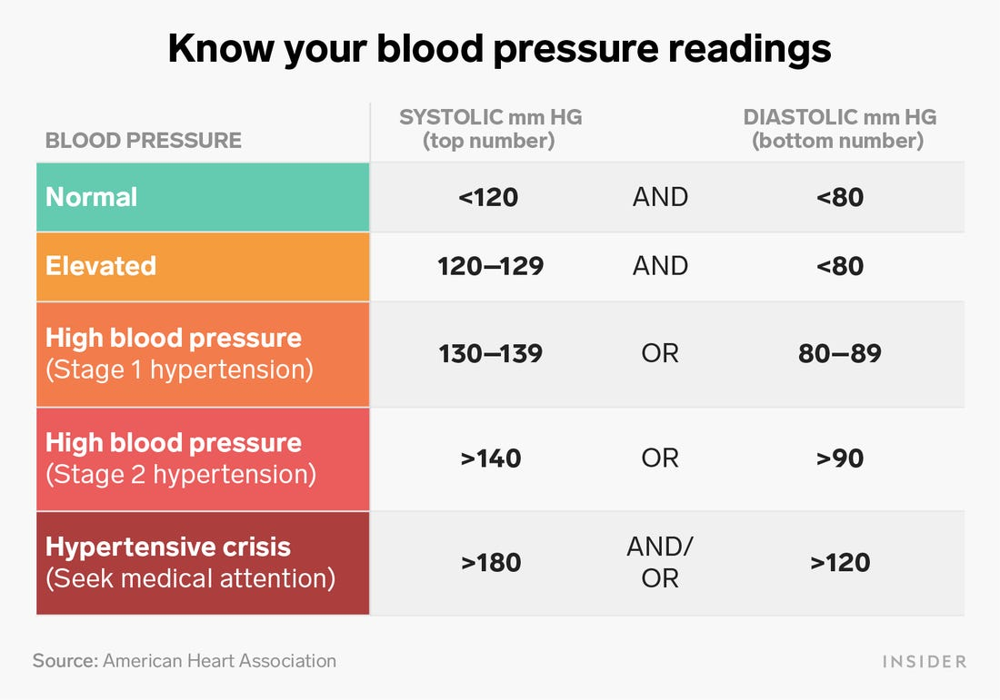

In [246]:
print("Diastilic pressure is higher than systolic one in {0} cases".format(df[df['ap_lo']> df['ap_hi']].shape[0]))

Diastilic pressure is higher than systolic one in 1231 cases


In [247]:
df[(df['ap_hi'] > 180 ) | (df['ap_lo'] > 120)]  #We Don't Have Null Value But We Have Unbeleiveble Values

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
101,51.282192,1,167,80.0,190,90,2,1,0,1,0,0,28.685145
228,47.915068,2,183,98.0,160,1100,1,2,1,0,1,1,29.263340
241,60.087671,2,157,60.0,160,1000,2,1,0,0,0,1,24.341758
260,49.909589,1,150,83.0,140,800,1,1,0,0,1,1,36.888889
329,64.128767,1,176,63.0,160,1000,2,2,0,0,0,1,20.338326
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69872,59.747945,1,152,56.0,160,1000,1,1,0,0,1,1,24.238227
69878,58.189041,2,168,95.0,160,1000,1,1,0,0,1,1,33.659297
69885,61.416438,2,166,78.0,170,1000,1,1,0,0,0,0,28.305995
69894,46.183562,1,160,70.0,200,100,1,2,0,0,1,1,27.343750


In [248]:
df['ap_lo'].describe()   # here min is negative ..so we need to fix this issue

count    69916.000000
mean        96.636306
std        188.546133
min        -70.000000
25%         80.000000
50%         80.000000
75%         90.000000
max      11000.000000
Name: ap_lo, dtype: float64

In [249]:
df['ap_hi'].describe()  # here also min is negatvie value

count    69916.000000
mean       128.826177
std        154.101382
min       -150.000000
25%        120.000000
50%        120.000000
75%        140.000000
max      16020.000000
Name: ap_hi, dtype: float64

In [250]:
out_filter = ((df["ap_hi"]>250) | (df["ap_lo"]>200))

In [251]:
df = df[~out_filter]
len(df)

68924

In [252]:
out_filter2 = ((df["ap_hi"] < 0) | (df["ap_lo"] < 0))
df = df[~out_filter2]

In [185]:
df.head(3)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
0,50.391781,2,168,62.0,110,80,1,1,0,0,1,0,21.967120
1,55.419178,1,156,85.0,140,90,3,1,0,0,1,1,34.927679
2,51.663014,1,165,64.0,130,70,3,1,0,0,0,1,23.507805


In [253]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68916 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          68916 non-null  float64
 1   gender       68916 non-null  int64  
 2   height       68916 non-null  int64  
 3   weight       68916 non-null  float64
 4   ap_hi        68916 non-null  int64  
 5   ap_lo        68916 non-null  int64  
 6   cholesterol  68916 non-null  int64  
 7   gluc         68916 non-null  int64  
 8   smoke        68916 non-null  int64  
 9   alco         68916 non-null  int64  
 10  active       68916 non-null  int64  
 11  cardio       68916 non-null  int64  
 12  bmi          68916 non-null  float64
dtypes: float64(3), int64(10)
memory usage: 7.4 MB


In [255]:
df['ap_lo'].describe()

count    68916.000000
mean        81.336090
std          9.869219
min          0.000000
25%         80.000000
50%         80.000000
75%         90.000000
max        190.000000
Name: ap_lo, dtype: float64

In [256]:
df['ap_hi'].describe()

count    68916.000000
mean       126.329256
std         17.698897
min          7.000000
25%        120.000000
50%        120.000000
75%        140.000000
max        240.000000
Name: ap_hi, dtype: float64

In [257]:
df

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
0,50.391781,2,168,62.0,110,80,1,1,0,0,1,0,21.967120
1,55.419178,1,156,85.0,140,90,3,1,0,0,1,1,34.927679
2,51.663014,1,165,64.0,130,70,3,1,0,0,0,1,23.507805
3,48.282192,2,169,82.0,150,100,1,1,0,0,1,1,28.710479
4,47.873973,1,156,56.0,100,60,1,1,0,0,0,0,23.011177
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,52.712329,2,168,76.0,120,80,1,1,1,0,1,0,26.927438
69996,61.920548,1,158,126.0,140,90,2,2,0,0,1,1,50.472681
69997,52.235616,2,183,105.0,180,90,3,1,0,1,0,1,31.353579
69998,61.454795,1,163,72.0,135,80,1,2,0,0,0,1,27.099251


In [258]:
from pandas_profiling import ProfileReport

In [259]:
profile= ProfileReport(df,title='Pandas Profiling Report',html={'style':{'full_width':True}})

In [192]:
profile.to_widgets()

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:433: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [260]:
target_name = 'cardio'
data_target = df[target_name]
df = df.drop([target_name], axis=1)

In [261]:
train, test, target, target_test = train_test_split(df, data_target, test_size=0.3, random_state=0)

In [262]:
len(train)


48241

In [263]:
from sklearn import metrics

**Naive Bayes**

In [264]:
gnb = GaussianNB()

In [265]:
gnb.fit(train,target)

GaussianNB(priors=None, var_smoothing=1e-09)

In [266]:
ypred = gnb.predict(test)



In [267]:
print("model accuracy(in %):", round(metrics.accuracy_score(target_test
                                                  , ypred)*100,2))

model accuracy(in %): 70.35


**Data Preprocessing**

In [268]:
from sklearn.feature_extraction.text import CountVectorizer


In [269]:
cv= CountVectorizer()


In [270]:
x_train= cv.fit_transform(train)
x_train.toarray()

array([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]])

In [271]:
x_test=cv.transform(test)
x_test.toarray()

array([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]])

In [272]:
gnb.score(test,target_test)

0.7035066505441354

Performance

In [273]:
pred = gnb.predict(test)
pred

array([0, 0, 1, ..., 1, 1, 0])

In [274]:
from sklearn.metrics import accuracy_score

In [275]:
accuracy_score(target_test,pred)

0.7035066505441354

In [276]:
confusion_matrix(target_test,pred)

array([[8318, 1999],
       [4131, 6227]])

In [277]:
from sklearn.metrics import  classification_report
print(classification_report(target_test , pred))

              precision    recall  f1-score   support

           0       0.67      0.81      0.73     10317
           1       0.76      0.60      0.67     10358

    accuracy                           0.70     20675
   macro avg       0.71      0.70      0.70     20675
weighted avg       0.71      0.70      0.70     20675



** Logistic Regression **

**Logistic Regression **

In [278]:
lg= LogisticRegression()
lg.fit(train,target)
ypred = lg.predict(test)
print("model accuracy(in %):", round(metrics.accuracy_score(target_test
                                                  , ypred)*100,2))

model accuracy(in %): 72.48


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


**Performance**

In [279]:
pred = lg.predict(test)
pred

array([0, 0, 1, ..., 1, 1, 0])

In [280]:
accuracy_score(target_test,pred)

0.7247883917775091

In [281]:
confusion_matrix(target_test,pred)

array([[8085, 2232],
       [3458, 6900]])

In [282]:
from sklearn.metrics import  classification_report
print(classification_report(target_test , pred))

              precision    recall  f1-score   support

           0       0.70      0.78      0.74     10317
           1       0.76      0.67      0.71     10358

    accuracy                           0.72     20675
   macro avg       0.73      0.72      0.72     20675
weighted avg       0.73      0.72      0.72     20675



In [283]:
from sklearn.feature_extraction.text import CountVectorizer
cv= CountVectorizer()
x_train= cv.fit_transform(train)
x_train.toarray()

array([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]])

In [284]:
x_test=cv.transform(test)
x_test.toarray()

array([[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]])

**Random Forest**

In [285]:
rf = RandomForestClassifier()

In [286]:
rf.fit(train,target)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [287]:

ypred = rf.predict(test)
print("model accuracy(in %):", round(metrics.accuracy_score(target_test
                                                  , ypred)*100,2))

model accuracy(in %): 71.85


**Performance**

In [288]:
pred = rf.predict(test)
pred

array([0, 1, 0, ..., 1, 1, 0])

In [289]:
accuracy_score(target_test,pred)

0.7185006045949214

In [290]:
confusion_matrix(target_test,pred)

array([[7636, 2681],
       [3139, 7219]])

In [291]:
from sklearn.metrics import  classification_report
print(classification_report(target_test , pred))

              precision    recall  f1-score   support

           0       0.71      0.74      0.72     10317
           1       0.73      0.70      0.71     10358

    accuracy                           0.72     20675
   macro avg       0.72      0.72      0.72     20675
weighted avg       0.72      0.72      0.72     20675



**Gaussian Naive Bayes**

In [292]:
# Gaussian Naive Bayes

gaussian = GaussianNB()
gaussian.fit(train, target)


GaussianNB(priors=None, var_smoothing=1e-09)

In [293]:
ypred = rf.predict(test)
print("model accuracy(in %):", round(metrics.accuracy_score(target_test
                                                  , ypred)*100,2))

model accuracy(in %): 71.85


**Performance**

In [294]:
pred = gaussian.predict(test)
pred


array([0, 0, 1, ..., 1, 1, 0])

In [295]:
accuracy_score(target_test,pred)

0.7035066505441354

In [296]:
confusion_matrix(target_test,pred)

array([[8318, 1999],
       [4131, 6227]])

In [297]:
from sklearn.metrics import  classification_report
print(classification_report(target_test , pred))

              precision    recall  f1-score   support

           0       0.67      0.81      0.73     10317
           1       0.76      0.60      0.67     10358

    accuracy                           0.70     20675
   macro avg       0.71      0.70      0.70     20675
weighted avg       0.71      0.70      0.70     20675



In [298]:
from sklearn.model_selection import train_test_split, GridSearchCV

**Models evaluation **

In [299]:
# Logistic Regression

logreg = LogisticRegression()
logreg.fit(train, target)
acc_log = round(logreg.score(train, target) * 100, 2)
acc_log

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


72.47

In [300]:
acc_test_log = round(logreg.score(test, target_test) * 100, 2)
acc_test_log

72.48

In [301]:

gaussian = GaussianNB()
gaussian.fit(train, target)
acc_gaussian = round(gaussian.score(train, target) * 100, 2)
acc_gaussian

70.08

In [302]:
acc_test_gaussian = round(gaussian.score(test, target_test) * 100, 2)
acc_test_gaussian

70.35

In [303]:
# Random Forest

random_forest = GridSearchCV(estimator=RandomForestClassifier(), param_grid={'n_estimators': [100, 300]}, cv=5).fit(train, target)
random_forest.fit(train, target)
acc_random_forest = round(random_forest.score(train, target) * 100, 2)
print(acc_random_forest,random_forest.best_params_)

99.98 {'n_estimators': 300}


In [304]:
acc_test_random_forest = round(random_forest.score(test, target_test) * 100, 2)
acc_test_random_forest

71.96

In [305]:
pred = random_forest.predict(test)
pred

array([0, 1, 0, ..., 1, 1, 0])

In [306]:
accuracy_score(target_test,pred)

0.7196130592503023

In [307]:
confusion_matrix(target_test,pred)

array([[7624, 2693],
       [3104, 7254]])

In [308]:
from sklearn.metrics import  classification_report
print(classification_report(target_test , pred))

              precision    recall  f1-score   support

           0       0.71      0.74      0.72     10317
           1       0.73      0.70      0.71     10358

    accuracy                           0.72     20675
   macro avg       0.72      0.72      0.72     20675
weighted avg       0.72      0.72      0.72     20675



In [309]:
models = pd.DataFrame({
    'Model': ['Logistic Regression','Naive Bayes', 
               
              'Random Forest'  ],
    
    'Score_train': [acc_log,  acc_gaussian, acc_random_forest],
    'Score_test': [acc_test_log,acc_test_gaussian,acc_test_random_forest]
                    })

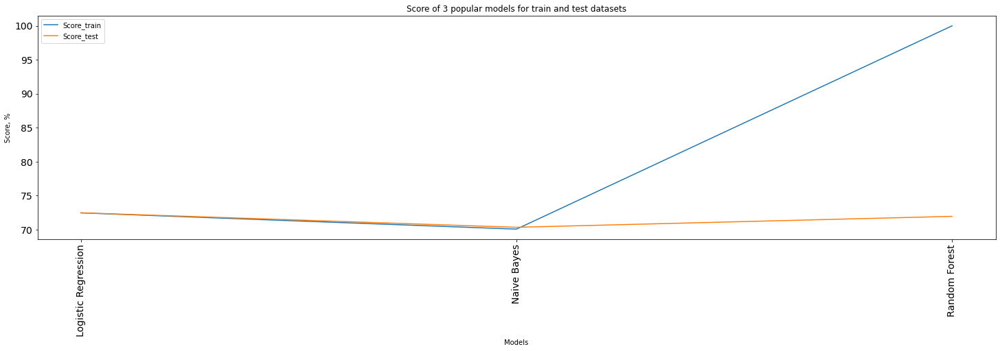

In [310]:
# Plot
plt.figure(figsize=[25,6])
xx = models['Model']
plt.tick_params(labelsize=14)
plt.plot(xx, models['Score_train'], label = 'Score_train')
plt.plot(xx, models['Score_test'], label = 'Score_test')
plt.legend()
plt.title('Score of 3 popular models for train and test datasets')
plt.xlabel('Models')
plt.ylabel('Score, %')
plt.xticks(xx, rotation='vertical')
plt.savefig('graph.png')
plt.show()